<a href="https://colab.research.google.com/github/kayneh-dev/IAT360-ComputerVisionProject/blob/main/YOLOv11_WeatherTime_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# YOLOv11 Classification — Weather × Time (Local Windows)

Dataset root:
```
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project
```

Expected structure:
```
IAT360_ComputerVision_Project/
├──NoAugData
│   ├─ train/
│   │  ├─ cloudy_afternoon/ ... images ...
│   │  ├─ ... 25 subfolders total ...
│   ├─ val/
│   │  ├─ ... same 25 subfolders ...
│   ├─ test/
│   └──── ... same 25 subfolders ...
└────WithAugData...same as above
```


## 1) Environment check

In [27]:

import sys, platform

print("Python:", sys.version)
print("Platform:", platform.platform())

try:
    import torch
    print("PyTorch:", torch.__version__)
    print("CUDA available?", torch.cuda.is_available())
    if torch.cuda.is_available():
        print("CUDA device count:", torch.cuda.device_count())
        print("Current device:", torch.cuda.current_device())
        print("Device name:", torch.cuda.get_device_name(torch.cuda.current_device()))
except Exception as e:
    print("Torch not available or error:", e)

try:
    import ultralytics
    from ultralytics import YOLO
    print("ultralytics:", ultralytics.__version__)
    print("YOLO imported OK")
except Exception as e:
    print("ultralytics import error:", e)
    print("If needed, run: pip install -U ultralytics")


Python: 3.13.9 (tags/v3.13.9:8183fa5, Oct 14 2025, 14:09:13) [MSC v.1944 64 bit (AMD64)]
Platform: Windows-11-10.0.26100-SP0
PyTorch: 2.9.0+cpu
CUDA available? False
ultralytics: 8.3.224
YOLO imported OK


## 2) Paths & dataset checks for NoAugData (No Augmented images)

In [31]:

from pathlib import Path

DATA_DIR = Path(r"C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData")
TRAIN_DIR = DATA_DIR / "train"
VAL_DIR   = DATA_DIR /  "val"
TEST_DIR  = DATA_DIR /  "test"

for p in [DATA_DIR, TRAIN_DIR, VAL_DIR]:
    print(f"{p}  ->  exists={p.exists()}")

def list_classes(split_dir):
    if not split_dir.exists():
        return []
    return sorted([d.name for d in split_dir.iterdir() if d.is_dir()])

train_classes = list_classes(TRAIN_DIR)
val_classes   = list_classes(VAL_DIR)
test_classes  = list_classes(TEST_DIR)

print("\n# of train classes:", len(train_classes))
print("# of val classes:  ", len(val_classes))
print("# of test classes: ", len(test_classes))
print("\nFirst 10 classes (train):", train_classes[:10])

if set(train_classes) != set(val_classes) or set(train_classes) != set(test_classes):
    print("\nWARNING: Class folders differ between splits.")
else:
    print("\nClass folders are aligned across train/val/test.")


C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData  ->  exists=True
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\train  ->  exists=True
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\val  ->  exists=True

# of train classes: 25
# of val classes:   25
# of test classes:  25

First 10 classes (train): ['cloudy_afternoon', 'cloudy_dawn', 'cloudy_dusk', 'cloudy_morning', 'cloudy_night', 'foggy_afternoon', 'foggy_dawn', 'foggy_dusk', 'foggy_morning', 'foggy_night']

Class folders are aligned across train/val/test.


## 3) Label utilities (weather/time mapping & filename parsing)

In [32]:

WEATHER_CODE = {
    "01": "cloudy",
    "02": "foggy",
    "03": "rainy",
    "04": "snowy",
    "05": "sunny",
}

TIME_CODE = {
    "01": "afternoon",
    "02": "dawn",
    "03": "dusk",
    "04": "morning",
    "05": "night",
}

def decode_filename_code(stem: str):
    try:
        parts = stem.split("-")
        if len(parts) != 3:
            return None, None
        _, w, t = parts
        return WEATHER_CODE.get(w), TIME_CODE.get(t)
    except Exception:
        return None, None

def combined_label_from_codes(stem: str):
    w, t = decode_filename_code(stem)
    if w is None or t is None:
        return None
    return f"{w}_{t}"


## 4) Train — YOLOv11 classification

In [33]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-cls.yaml")  # build a new model from YAML
model = YOLO("yolo11n-cls.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n-cls.yaml").load("yolo11n-cls.pt")  # build from YAML and transfer weights

EPOCHS = 30
BATCH  = 16
IMGSZ  = 224
NAME   = "weather_time_cls_y11"

results = model.train(
    data=str(DATA_DIR),
    epochs=EPOCHS,
    batch=BATCH,
    imgsz=IMGSZ,
    patience=5,
    name=NAME,
    project=str(DATA_DIR / "runs" / "classify")
)
results


YOLO11n-cls summary: 86 layers, 2,812,104 parameters, 2,812,104 gradients, 4.3 GFLOPs
YOLO11n-cls summary: 86 layers, 2,812,104 parameters, 2,812,104 gradients, 4.3 GFLOPs
Transferred 236/236 items from pretrained weights
Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000013F42B418D0>
curves: []
curves_results: []
fitness: 0.9550000131130219
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9200000166893005, 'metrics/accuracy_top5': 0.9900000095367432, 'fitness': 0.9550000131130219}
save_dir: WindowsPath('C:/Users/Kayne/Desktop/IAT360_ComputerVision_Project/NoAugData/runs/classify/weather_time_cls_y11')
speed: {'preprocess': 0.0007680000271648169, 'inference': 1.5478210000583204, 'loss': 2.6999914553016424e-05, 'postprocess': 7.499998901039362e-05}
task: 'classify'
top1: 0.9200000166893005
top5: 0.9900000095367432

## 5) Validate / Test

In [34]:
# --- Evaluate NO-AUG run with best.pt (fallback to last.pt or in-memory) ---
from pathlib import Path
from ultralytics import YOLO

NOAUG_RUN_NAME = "weather_time_cls_y11"   # <- change to your no-aug run name
RUNS_ROOT = DATA_DIR / "runs" / "classify"
BEST = RUNS_ROOT / NOAUG_RUN_NAME / "weights" / "best.pt"
LAST = RUNS_ROOT / NOAUG_RUN_NAME / "weights" / "last.pt"

if BEST.exists():
    print("NOAUG: evaluating with BEST weights:", BEST)
    model_noaug = YOLO(str(BEST))
elif LAST.exists():
    print("NOAUG: BEST not found; evaluating with LAST weights:", LAST)
    model_noaug = YOLO(str(LAST))
else:
    # If you happen to still have the no-aug model in memory from training, you can use it:
    try:
        _ = model  # your earlier no-aug model variable name, if still defined
        print("NOAUG: no saved weights found; using in-memory `model`.")
        model_noaug = model
    except NameError:
        raise FileNotFoundError("No no-aug weights found and no in-memory model available. "
                                "Please set NOAUG_RUN_NAME correctly or retrain.")

# Evaluate on NOAUG data root (train/val/test under NoAugData)
val_metrics_noaug  = model_noaug.val(data=str(NOAUG_ROOT))
print(val_metrics_noaug)

test_metrics_noaug = model_noaug.val(data=str(NOAUG_ROOT), split="test")
print(test_metrics_noaug)


Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,558,049 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\train... found 400 images in 25 classes  
val: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\val... found 100 images in 25 classes  
ERROR test: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\test... found 60 images in 11 classes (requires 25 classes, not 11)
val: Fast image access  (ping: 0.10.0 ms, read: 2393.8273.0 MB/s, size: 2341.7 KB)
val: Scanning C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\val... 100 images, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 185.7Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 7/7 1.9it/s 3.7s
                   all       0.92       0.99
Speed: 0.0ms preprocess, 2.6ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to C:\Users\Kay

## 6) Confusion matrix & per-class names

C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\runs\classify\weather_time_cls_y11\confusion_matrix.png exists: True


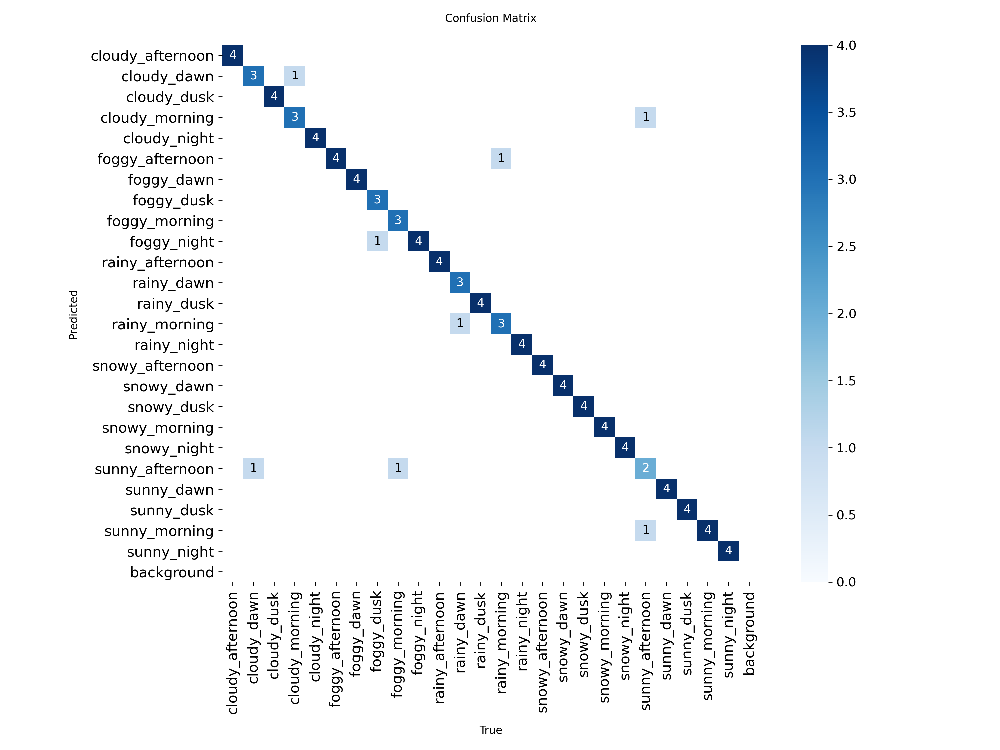

C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\runs\classify\weather_time_cls_y11\val\confusion_matrix.png exists: False
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\runs\classify\weather_time_cls_y11\test\confusion_matrix.png exists: False
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\runs\classify\weather_time_cls_y11\results.png exists: True


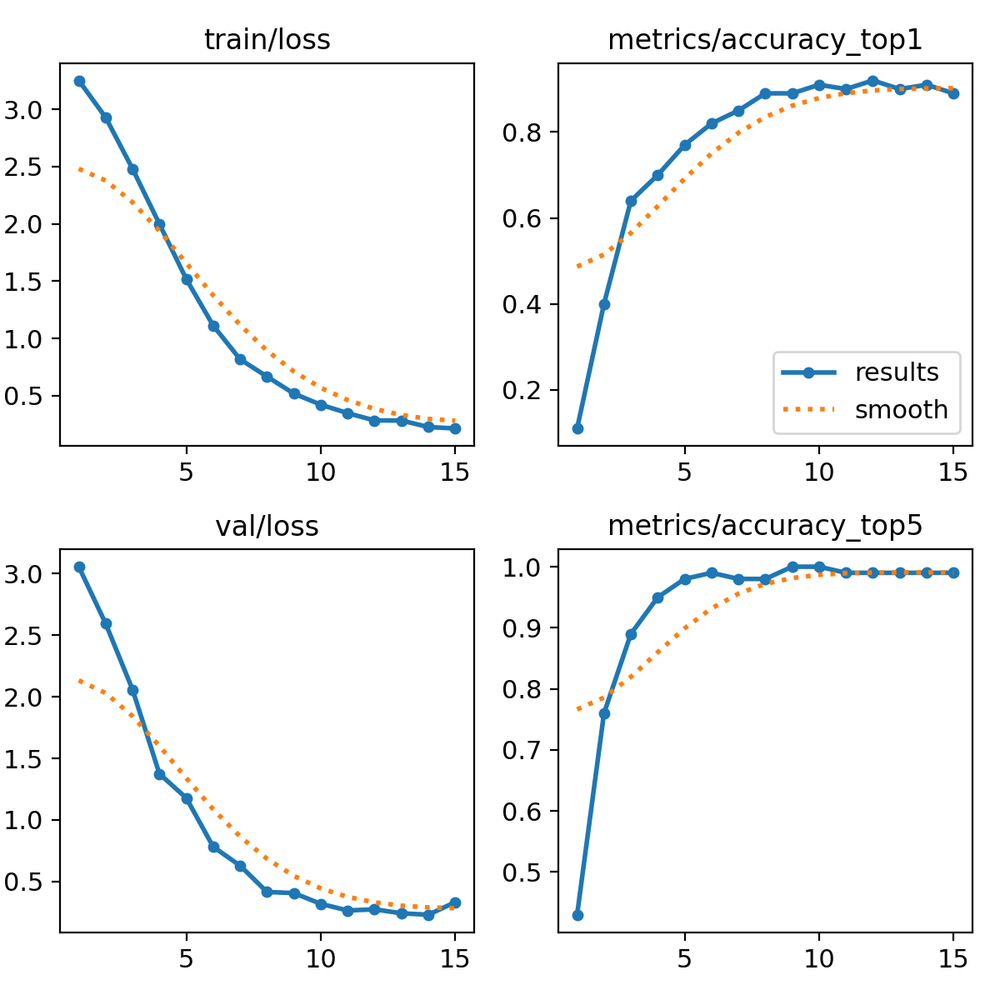


Model classes (index -> name):
{0: 'cloudy_afternoon', 1: 'cloudy_dawn', 2: 'cloudy_dusk', 3: 'cloudy_morning', 4: 'cloudy_night', 5: 'foggy_afternoon', 6: 'foggy_dawn', 7: 'foggy_dusk', 8: 'foggy_morning', 9: 'foggy_night', 10: 'rainy_afternoon', 11: 'rainy_dawn', 12: 'rainy_dusk', 13: 'rainy_morning', 14: 'rainy_night', 15: 'snowy_afternoon', 16: 'snowy_dawn', 17: 'snowy_dusk', 18: 'snowy_morning', 19: 'snowy_night', 20: 'sunny_afternoon', 21: 'sunny_dawn', 22: 'sunny_dusk', 23: 'sunny_morning', 24: 'sunny_night'}


In [35]:

from pathlib import Path
from IPython.display import Image, display

RUNS_DIR = Path(DATA_DIR) / "runs" / "classify" / "weather_time_cls_y11"
candidates = [
    RUNS_DIR / "confusion_matrix.png",
    RUNS_DIR / "val" / "confusion_matrix.png",
    RUNS_DIR / "test" / "confusion_matrix.png",
    RUNS_DIR / "results.png",
]

for p in candidates:
    print(p, "exists:", p.exists())
    if p.exists():
        display(Image(filename=str(p)))

print("\nModel classes (index -> name):")
print(model.names)


## 7) Worked vs failed examples (from **test**)

Found test images: 60
Correct: 22  |  Incorrect: 38

=== Worked examples (showing up to 12) ===
TRUE = cloudy_morning  —  0005-01-04.png


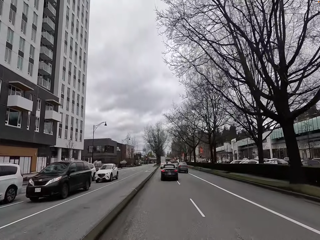

TRUE = cloudy_morning  —  0007-01-04.png


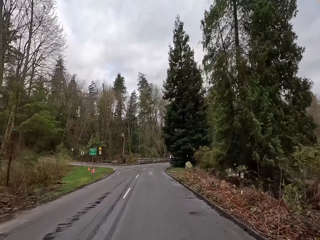

TRUE = cloudy_morning  —  0049-01-04.png


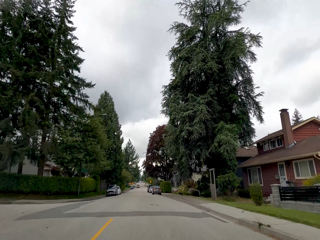

TRUE = cloudy_morning  —  0050-01-04.png


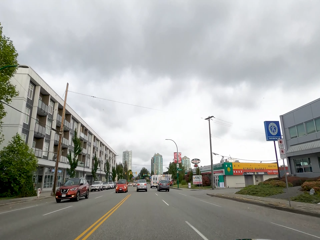

TRUE = cloudy_morning  —  0053-01-04.png


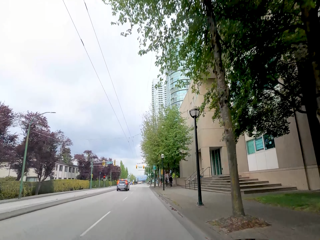

TRUE = cloudy_morning  —  0054-01-04.png


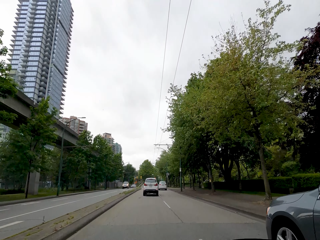

TRUE = cloudy_morning  —  0055-01-04.png


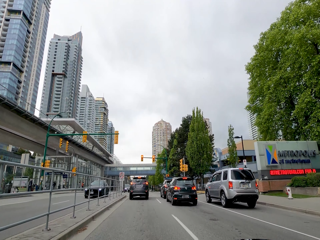

TRUE = cloudy_morning  —  0056-01-04.png


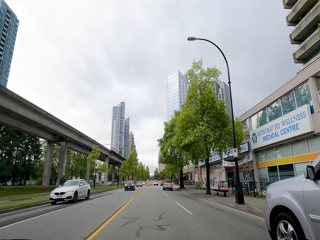

TRUE = cloudy_morning  —  0057-01-04.png


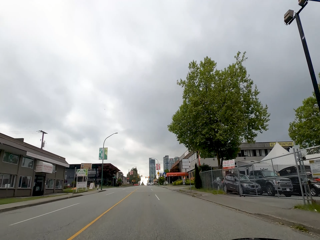

TRUE = cloudy_morning  —  0059-01-04.png


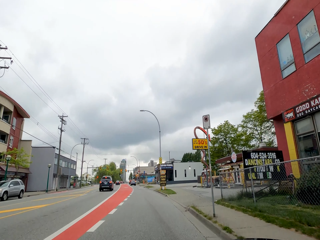

TRUE = rainy_afternoon  —  0009-03-01.png


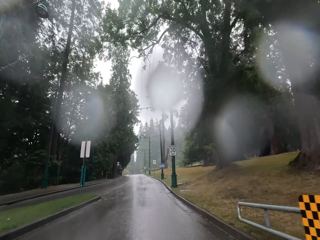

TRUE = rainy_afternoon  —  0010-03-01.png


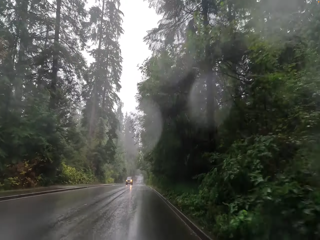


=== Failed examples (showing up to 12) ===
TRUE = cloudy_afternoon | PRED = cloudy_dusk  —  0003-01-01.png


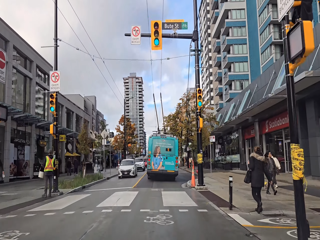

TRUE = cloudy_afternoon | PRED = rainy_afternoon  —  0013-01-01.png


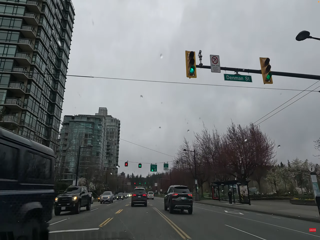

TRUE = cloudy_afternoon | PRED = cloudy_morning  —  0048-01-01.png


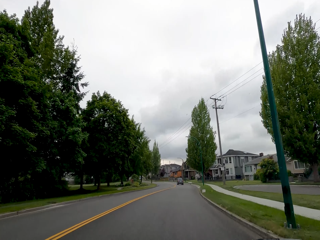

TRUE = cloudy_afternoon | PRED = cloudy_morning  —  0051-01-01.png


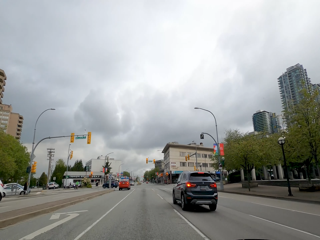

TRUE = cloudy_afternoon | PRED = cloudy_morning  —  0058-01-01.png


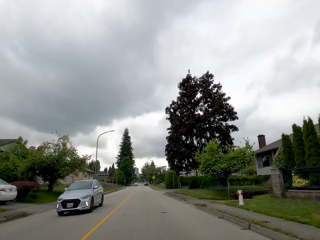

TRUE = cloudy_dawn | PRED = cloudy_morning  —  0004-01-02.png


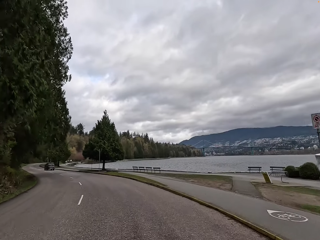

TRUE = cloudy_dawn | PRED = cloudy_afternoon  —  0006-01-02.png


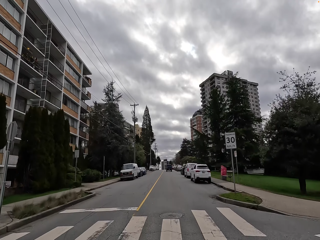

TRUE = cloudy_dawn | PRED = rainy_afternoon  —  0045-01-02.png


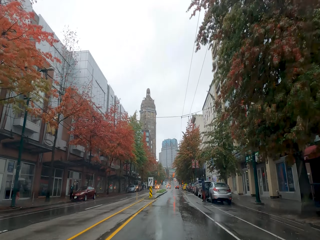

TRUE = cloudy_morning | PRED = foggy_afternoon  —  0052-01-04.png


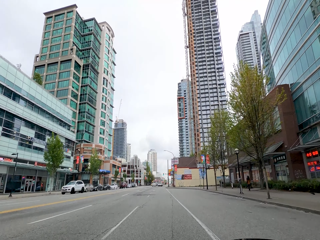

TRUE = foggy_afternoon | PRED = rainy_afternoon  —  0011-02-01.png


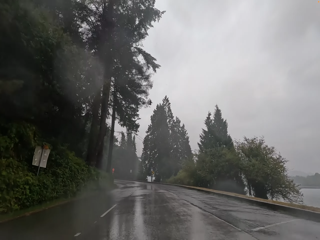

TRUE = rainy_afternoon | PRED = cloudy_morning  —  0008-03-01.png


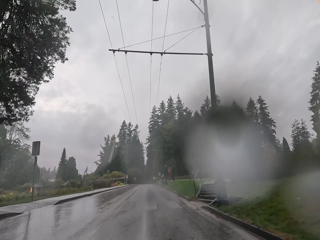

TRUE = rainy_afternoon | PRED = rainy_morning  —  0040-03-01.png


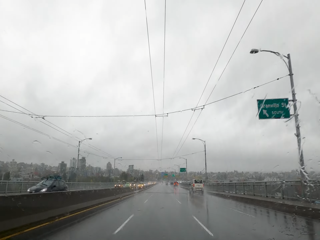

In [36]:

import random
from PIL import Image as PILImage
from IPython.display import display

test_images = []
for cls in sorted(TEST_DIR.iterdir()) if TEST_DIR.exists() else []:
    if cls.is_dir():
        for img in cls.iterdir():
            if img.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp"}:
                test_images.append(img)
print("Found test images:", len(test_images))

N = min(200, len(test_images))
sample_paths = random.sample(test_images, N) if len(test_images) > N else test_images

preds = model.predict(source=[str(p) for p in sample_paths], imgsz=IMGSZ, verbose=False)

file_records = []  # (path, true_idx, pred_idx)
name_to_idx = {v:k for k,v in model.names.items()}

for p, r in zip(sample_paths, preds):
    true_cls = p.parent.name
    true_idx = name_to_idx.get(true_cls, None)
    pred_idx = int(r.probs.top1) if hasattr(r, "probs") else None
    file_records.append((p, true_idx, pred_idx))

correct = [(p,t) for (p,t,pr) in file_records if t == pr]
incorrect = [(p,t,pr) for (p,t,pr) in file_records if t != pr]

print(f"Correct: {len(correct)}  |  Incorrect: {len(incorrect)}")

def show_images(items, title, max_show=12):
    print(f"\n=== {title} (showing up to {max_show}) ===")
    for entry in items[:max_show]:
        if len(entry) == 2:
            p, t = entry
            txt = f"TRUE = {model.names.get(t)}"
        else:
            p, t, pr = entry
            txt = f"TRUE = {model.names.get(t)} | PRED = {model.names.get(pr)}"
        print(txt, " — ", p.name)
        try:
            display(PILImage.open(p).resize((320, 240)))
        except Exception as e:
            print("Image open error:", e)

show_images(correct, "Worked examples")
show_images(incorrect, "Failed examples")


In [38]:
# Collect val set paths and labels, then run the model to get probabilities
from pathlib import Path
import numpy as np

DATA_DIR = Path(r"C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData")
VAL_DIR = DATA_DIR / "val"

# Map class name -> index from the trained model
class_to_idx = {name:i for i, name in model.names.items()}

val_paths = []
val_labels = []
for cls_dir in sorted(VAL_DIR.iterdir()):
    if cls_dir.is_dir():
        cls_name = cls_dir.name
        if cls_name not in class_to_idx:
            print("WARNING: class not in model.names:", cls_name)
            continue
        for img_path in cls_dir.iterdir():
            if img_path.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp"}:
                val_paths.append(str(img_path))
                val_labels.append(class_to_idx[cls_name])

print("Val images:", len(val_paths), "  classes:", len(model.names))

# Predict probabilities with YOLOv11 classifier
pred_results = model.predict(source=val_paths, imgsz=224, verbose=False)

# Build arrays
y_true = np.array(val_labels, dtype=int)
# y_prob: shape [N, C]
y_prob = np.vstack([r.probs.data.cpu().numpy() for r in pred_results])
y_pred = y_prob.argmax(axis=1)
print("Shapes:", y_true.shape, y_prob.shape)

Val images: 100   classes: 25
Shapes: (100,) (100, 25)


Per-class metrics (argmax decision):


,precision,recall,f1-score,support
cloudy_afternoon,1.00,1.00,1.000000,4.0
cloudy_dawn,0.75,0.75,0.750000,4.0
cloudy_dusk,1.00,1.00,1.000000,4.0
cloudy_morning,0.75,0.75,0.750000,4.0
cloudy_night,1.00,1.00,1.000000,4.0
foggy_afternoon,0.80,1.00,0.888889,4.0
foggy_dawn,1.00,1.00,1.000000,4.0
foggy_dusk,1.00,0.75,0.857143,4.0
foggy_morning,1.00,0.75,0.857143,4.0
foggy_night,0.80,1.00,0.888889,4.0



Macro F1: 0.920 | Micro F1: 0.920


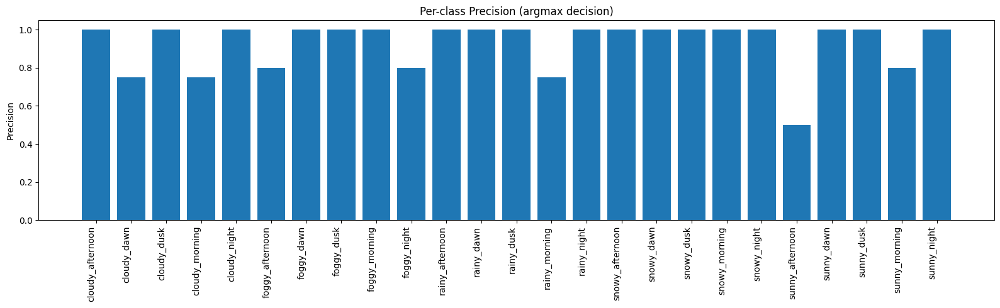

Saved: per_class_precision.png


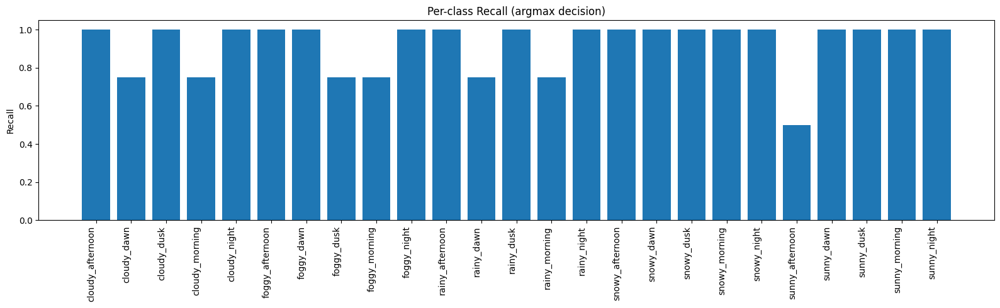

Saved: per_class_recall.png


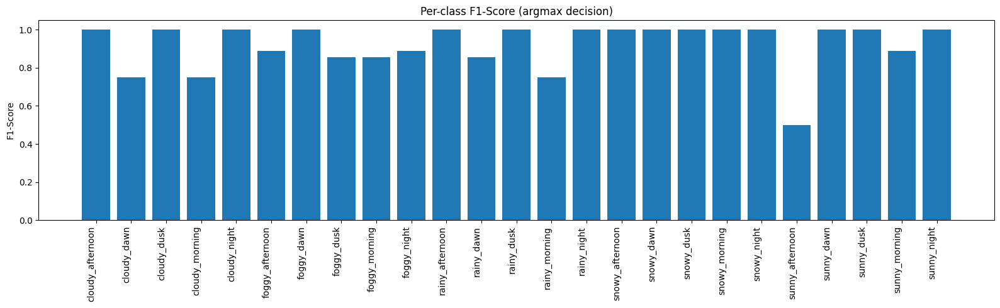

Saved: per_class_f1score.png


In [39]:
# 1) Ensure inline plotting
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, precision_recall_fscore_support, f1_score

# Build per-class labels in index order used by the model
class_names = [model.names[i] for i in range(len(model.names))]

# Single-point metrics at the argmax decision
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Keep only the actual classes (drop accuracy/macro avg/weighted avg at the bottom)
df_classes = df.loc[class_names, ["precision", "recall", "f1-score", "support"]]

# Show the table for quick inspection
print("Per-class metrics (argmax decision):")
display(df_classes)

# Also print overall macro/micro
macro_f1 = f1_score(y_true, y_pred, average="macro")
micro_f1 = f1_score(y_true, y_pred, average="micro")
print(f"\nMacro F1: {macro_f1:.3f} | Micro F1: {micro_f1:.3f}")

# 2) Plot each metric as its own bar chart to keep labels readable
def plot_metric(metric_name):
    plt.figure(figsize=(16, 5))
    plt.bar(range(len(df_classes)), df_classes[metric_name].values)
    plt.xticks(range(len(df_classes)), df_classes.index, rotation=90, ha="right")
    plt.ylabel(metric_name.title())
    plt.title(f"Per-class {metric_name.title()} (argmax decision)")
    plt.tight_layout()
    out = f"per_class_{metric_name.replace('-', '')}.png"
    plt.savefig(out, dpi=200)
    plt.show()
    print(f"Saved: {out}")

for metric in ["precision", "recall", "f1-score"]:
    plot_metric(metric)

Loading BEST: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11\weights\best.pt
Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,558,049 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\train... found 400 images in 25 classes  
val: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\val... found 100 images in 25 classes  
ERROR test: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\test... found 60 images in 11 classes (requires 25 classes, not 11)
test: Fast image access  (ping: 0.10.0 ms, read: 1239.2223.5 MB/s, size: 2044.1 KB)
test: Scanning C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData\test... 60 images, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 120.6Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 4/4 1.4it/s 2.9s
                   all      0.367     

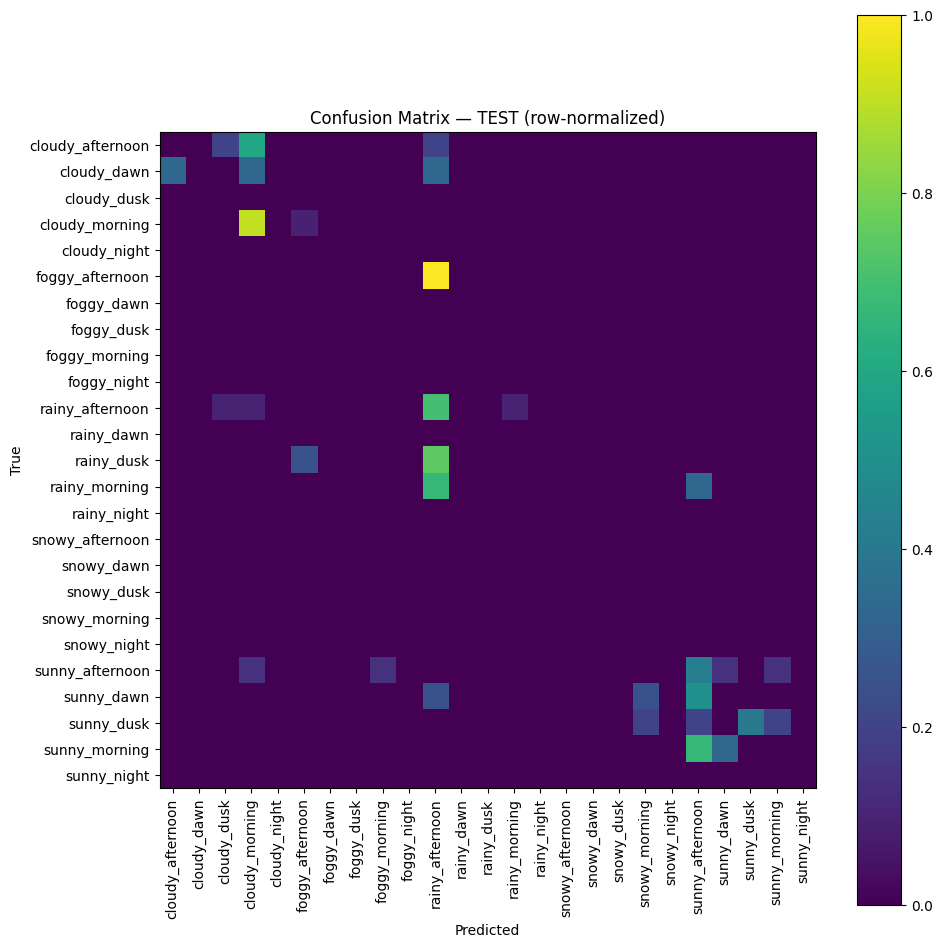

Saved normalized confusion matrix to: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\testrun\confusion_matrix_normalized.png


In [58]:
# --- Generate a NORMALIZED TEST confusion matrix into DATA_DIR/testrun ---
from pathlib import Path
from ultralytics import YOLO
from IPython.display import Image, display
import numpy as np
import matplotlib.pyplot as plt
import os

# Choose which run/data root you want to evaluate
RUN_NAME  = "weather_time_cls_y11"  # or your no-aug run name
DATA_ROOT = NOAUG_ROOT                             # or NOAUG_ROOT

TESTRUN_DIR = DATA_DIR / "testrun"
TESTRUN_DIR.mkdir(parents=True, exist_ok=True)

# Load best (fallback last)
RUNS_DIR  = DATA_DIR / "runs" / "classify" / RUN_NAME / "weights"
CKPT_BEST = RUNS_DIR / "best.pt"
CKPT_LAST = RUNS_DIR / "last.pt"
if CKPT_BEST.exists():
    print("Loading BEST:", CKPT_BEST)
    model_eval = YOLO(str(CKPT_BEST))
elif CKPT_LAST.exists():
    print("BEST not found; loading LAST:", CKPT_LAST)
    model_eval = YOLO(str(CKPT_LAST))
else:
    raise FileNotFoundError(f"No weights found under {RUNS_DIR}")

# Try Ultralytics' own plots (it *may* produce a normalized PNG)
_ = model_eval.val(
    data=str(DATA_ROOT),
    split="test",
    plots=True,
    project=str(DATA_DIR),
    name="testrunNoAug"  # saves into DATA_DIR/testrun
)

# Prefer a normalized matrix if Ultralytics wrote one
ultra_candidates = [
    TESTRUN_DIR / "confusion_matrix_normalized.png",
    TESTRUN_DIR / "test" / "confusion_matrix_normalized.png"
]
shown = False
for p in ultra_candidates:
    if p.exists():
        print("Found Ultralytics normalized matrix at:", p)
        display(Image(filename=str(p)))
        shown = True
        break

# If Ultralytics didn't produce normalized, build our own ROW-NORMALIZED matrix and save it.
if not shown:
    print("Ultralytics normalized PNG not found — creating one manually…")

    # 1) Collect TEST data
    TEST_DIR = DATA_ROOT / "test"
    img_exts = {".jpg", ".jpeg", ".png", ".bmp"}

    paths, labels = [], []
    name_to_idx = {name:i for i, name in model_eval.names.items()}
    for cls_dir in sorted(TEST_DIR.iterdir()):
        if cls_dir.is_dir() and cls_dir.name in name_to_idx:
            for f in cls_dir.iterdir():
                if f.suffix.lower() in img_exts:
                    paths.append(str(f))
                    labels.append(name_to_idx[cls_dir.name])

    # 2) Predict and build confusion matrix
    preds = model_eval.predict(source=paths, imgsz=224, verbose=False)
    y_true = np.array(labels, dtype=int)
    y_pred = np.array([int(r.probs.top1) for r in preds], dtype=int)

    from sklearn.metrics import confusion_matrix
    labels_txt = [model_eval.names[i] for i in range(len(model_eval.names))]
    cm = confusion_matrix(y_true, y_pred, labels=range(len(labels_txt)))

    # 3) Row-normalize (each row sums to 1.0); guard zeros
    with np.errstate(divide="ignore", invalid="ignore"):
        row_sums = cm.sum(axis=1, keepdims=True)
        cm_norm = cm.astype(float) / np.where(row_sums == 0, 1, row_sums)
        cm_norm = np.nan_to_num(cm_norm, nan=0.0, posinf=0.0, neginf=0.0)

    # 4) Plot & save normalized matrix
    plt.figure(figsize=(10, 10))
    plt.imshow(cm_norm, interpolation="nearest")
    plt.title("Confusion Matrix — TEST (row-normalized)")
    plt.xticks(range(len(labels_txt)), labels_txt, rotation=90)
    plt.yticks(range(len(labels_txt)), labels_txt)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.colorbar()
    plt.tight_layout()
    out_png = TESTRUN_DIR / "confusion_matrix_normalized.png"
    plt.savefig(out_png, dpi=200)
    plt.show()
    print("Saved normalized confusion matrix to:", out_png)


## 9) Why there is no F1–confidence curve for classification

F1 confidence curves are for object detection/segmentation, where a confidence threshold filters predicted boxes.
In single/multi-label classification, the model uses softmax and picks the top-1 class. There is no threshold sweep,
so we report accuracy, per-class precision/recall/F1, and the confusion matrix instead.



### Hyperparameter notes
- **epochs=25** is a practical baseline for convergence without excessive overfitting.
- **patience=5** stops when validation does not improve, saving time.
- **batch=16**, **imgsz=224** are standard; adjust to fit your GPU/CPU.


##Paths & dataset checks for WithAugData

Data Augmentation of the data set

In [40]:
from pathlib import Path
DATA_DIR = Path(r"C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project")
NOAUG_ROOT = DATA_DIR / "NoAugData"
AUG_ROOT   = DATA_DIR / "WithAugData"
N_AUG_PER_IMAGE = 1
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp"}
print("DATA_DIR:", DATA_DIR, "\nNOAUG_ROOT:", NOAUG_ROOT, "\nAUG_ROOT:", AUG_ROOT, "\nN_AUG_PER_IMAGE:", N_AUG_PER_IMAGE)

DATA_DIR: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project 
NOAUG_ROOT: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\NoAugData 
AUG_ROOT: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData 
N_AUG_PER_IMAGE: 1


In [41]:

# If needed, uncomment and run:
%pip install -U ultralytics albumentations opencv-python tqdm scikit-learn


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: C:\Users\Kayne\AppData\Local\Programs\Python\Python313\python.exe -m pip install --upgrade pip


In [42]:
import os, shutil, random
from tqdm import tqdm
import cv2, numpy as np
import albumentations as A

random.seed(42)
np.random.seed(42)

aug = A.Compose([
    A.OneOf([A.RandomBrightnessContrast(p=1), A.CLAHE(p=1), A.HueSaturationValue(p=1)], p=0.7),
    A.OneOf([A.GaussianBlur(blur_limit=5, p=1), A.MotionBlur(blur_limit=7, p=1), A.GaussNoise(var_limit=(5.0, 40.0), p=1)], p=0.5),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.03, scale_limit=0.05, rotate_limit=10, border_mode=cv2.BORDER_REFLECT_101, p=0.6),
], p=1.0)

def ensure_clean_dir(path):
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path, exist_ok=True)

def copy_split(src_split, dst_split):
    for root, dirs, files in os.walk(src_split):
        rel = os.path.relpath(root, src_split)
        out_dir = os.path.join(dst_split, rel) if rel != "." else dst_split
        os.makedirs(out_dir, exist_ok=True)
        for f in files:
            if os.path.splitext(f)[1].lower() in IMG_EXTS:
                shutil.copy2(os.path.join(root, f), os.path.join(out_dir, f))

def augment_train(src_train, dst_train, n_aug):
    for cls in sorted(os.listdir(src_train)):
        cls_src = os.path.join(src_train, cls)
        if not os.path.isdir(cls_src):
            continue
        cls_dst = os.path.join(dst_train, cls)
        os.makedirs(cls_dst, exist_ok=True)
        imgs = [f for f in os.listdir(cls_src) if os.path.splitext(f)[1].lower() in IMG_EXTS]
        for f in tqdm(imgs, desc=f"Augmenting {cls}", leave=False):
            src_path = os.path.join(cls_src, f)
            shutil.copy2(src_path, os.path.join(cls_dst, f))
            img = cv2.imread(src_path)
            if img is None:
                continue
            stem, ext = os.path.splitext(f)
            for k in range(n_aug):
                out = aug(image=img)["image"]
                if out.dtype != np.uint8:
                    out = np.clip(out, 0, 255).astype(np.uint8)
                out_name = f"{stem}_aug{k+1}{ext}"
                cv2.imwrite(os.path.join(cls_dst, out_name), out)

SRC_TRAIN, SRC_VAL, SRC_TEST = (NOAUG_ROOT / "train", NOAUG_ROOT / "val", NOAUG_ROOT / "test")
DST_TRAIN, DST_VAL, DST_TEST = (AUG_ROOT / "train", AUG_ROOT / "val", AUG_ROOT / "test")

ensure_clean_dir(str(AUG_ROOT))
os.makedirs(str(DST_TRAIN), exist_ok=True)
os.makedirs(str(DST_VAL),   exist_ok=True)
os.makedirs(str(DST_TEST),  exist_ok=True)

print("Copying val/test (unchanged) ...")
copy_split(str(SRC_VAL), str(DST_VAL))
copy_split(str(SRC_TEST), str(DST_TEST))

print("Augmenting train ...")
augment_train(str(SRC_TRAIN), str(DST_TRAIN), N_AUG_PER_IMAGE)
print("Done. Augmented dataset at:", AUG_ROOT)


C:\Users\Kayne\AppData\Local\Temp\ipykernel_15548\1558728521.py:11: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.OneOf([A.GaussianBlur(blur_limit=5, p=1), A.MotionBlur(blur_limit=7, p=1), A.GaussNoise(var_limit=(5.0, 40.0), p=1)], p=0.5),
C:\Users\Kayne\AppData\Roaming\Python\Python313\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Copying val/test (unchanged) ...
Augmenting train ...


Done. Augmented dataset at: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData


Train Yolo Model

In [45]:
from ultralytics import YOLO

AUG_RUN_NAME = "weather_time_cls_y11_WithAugData"
IMGSZ = 224
BATCH = 16
EPOCHS = 25

model_aug = YOLO("yolo11n-cls.pt")
results_aug = model_aug.train(
    data=str(AUG_ROOT),
    epochs=EPOCHS,
    batch=BATCH,
    imgsz=IMGSZ,
    patience=5,
    name=AUG_RUN_NAME,
    project=str(AUG_ROOT / "runs" / "classify")
)
results_aug


Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=weather_time_cls_y11_WithAugData, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, ove

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000013F42DE4440>
curves: []
curves_results: []
fitness: 0.9550000131130219
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9200000166893005, 'metrics/accuracy_top5': 0.9900000095367432, 'fitness': 0.9550000131130219}
save_dir: WindowsPath('C:/Users/Kayne/Desktop/IAT360_ComputerVision_Project/WithAugData/runs/classify/weather_time_cls_y11_WithAugData')
speed: {'preprocess': 0.0008719998731976375, 'inference': 2.6849119999678805, 'loss': 3.4999975468963385e-05, 'postprocess': 8.600007276982069e-05}
task: 'classify'
top1: 0.9200000166893005
top5: 0.9900000095367432

Evaluate on val/test (augmented-trained model)

In [46]:
# --- Load the best checkpoint from the augmented run, then evaluate ---
from pathlib import Path
from ultralytics import YOLO

AUG_RUN_NAME = "weather_time_cls_y11_WithAugData"  # must match your training cell
RUNS_ROOT = DATA_DIR / "runs" / "classify"
BEST = RUNS_ROOT / AUG_RUN_NAME / "weights" / "best.pt"
LAST = RUNS_ROOT / AUG_RUN_NAME / "weights" / "last.pt"

if BEST.exists():
    print("Evaluating with BEST weights:", BEST)
    model_best = YOLO(str(BEST))
elif LAST.exists():
    print("BEST not found; evaluating with LAST weights:", LAST)
    model_best = YOLO(str(LAST))
else:
    print("No saved weights found; falling back to in-memory model_aug.")
    model_best = model_aug  # last in-memory state

# Evaluate on val and test using the chosen weights
val_metrics_aug  = model_best.val(data=str(AUG_ROOT))                 # uses val split
print(val_metrics_aug)

test_metrics_aug = model_best.val(data=str(AUG_ROOT), split="test")   # uses test split
print(test_metrics_aug)


Evaluating with BEST weights: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\weights\best.pt
Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,558,049 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\train... found 800 images in 25 classes  
val: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\val... found 100 images in 25 classes  
ERROR test: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\test... found 60 images in 11 classes (requires 25 classes, not 11)
val: Fast image access  (ping: 0.00.0 ms, read: 2337.6236.9 MB/s, size: 2341.7 KB)
val: Scanning C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\val... 100 images, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 288.5Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 7/7 1.9it/s 3.6s
  

Confusion Matrix

In [ ]:
from pathlib import Path
from IPython.display import Image, display

RUNS_DIR = Path(DATA_DIR) / "runs" / "classify" / "weather_time_cls_y11"
candidates = [
    RUNS_DIR / "confusion_matrix.png",
    RUNS_DIR / "val" / "confusion_matrix.png",
    RUNS_DIR / "test" / "confusion_matrix.png",
    RUNS_DIR / "results.png",
]

for p in candidates:
    print(p, "exists:", p.exists())
    if p.exists():
        display(Image(filename=str(p)))

print("\nModel classes (index -> name):")
print(model.names)

In [47]:
import numpy as np, os

VAL_DIR_AUG = AUG_ROOT / "val"
class_to_idx_aug = {name:i for i, name in model_aug.names.items()}

val_paths_aug, val_labels_aug = [], []
for cls_name in sorted(os.listdir(VAL_DIR_AUG)):
    cls_dir = VAL_DIR_AUG / cls_name
    if not cls_dir.is_dir():
        continue
    if cls_name not in class_to_idx_aug:
        continue
    for f in os.listdir(cls_dir):
        if os.path.splitext(f)[1].lower() in IMG_EXTS:
            val_paths_aug.append(str(cls_dir / f))
            val_labels_aug.append(class_to_idx_aug[cls_name])

print("Val images collected:", len(val_paths_aug))

pred_results_aug = model_aug.predict(source=val_paths_aug, imgsz=224, verbose=False)
y_true = np.array(val_labels_aug, dtype=int)
y_prob = np.vstack([r.probs.data.cpu().numpy() for r in pred_results_aug])
y_pred = y_prob.argmax(axis=1)
print("Shapes:", y_true.shape, y_prob.shape)

Val images collected: 100
Shapes: (100,) (100, 25)


Per-class metrics (WithAugData, argmax decision):


,precision,recall,f1-score,support
cloudy_afternoon,1.000000,1.00,1.000000,4.0
cloudy_dawn,0.666667,0.50,0.571429,4.0
cloudy_dusk,1.000000,1.00,1.000000,4.0
cloudy_morning,0.666667,0.50,0.571429,4.0
cloudy_night,1.000000,1.00,1.000000,4.0
foggy_afternoon,0.800000,1.00,0.888889,4.0
foggy_dawn,0.800000,1.00,0.888889,4.0
foggy_dusk,1.000000,1.00,1.000000,4.0
foggy_morning,1.000000,0.75,0.857143,4.0
foggy_night,1.000000,1.00,1.000000,4.0


Macro F1: 0.919 | Micro F1: 0.920


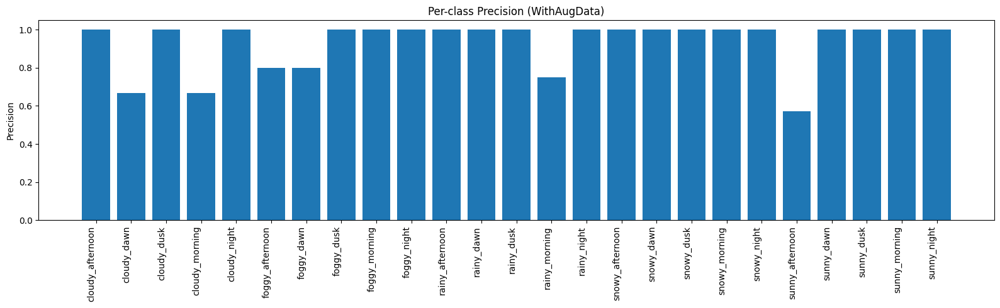

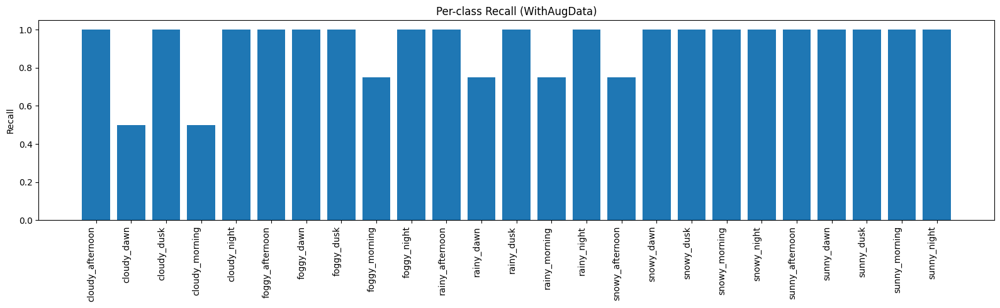

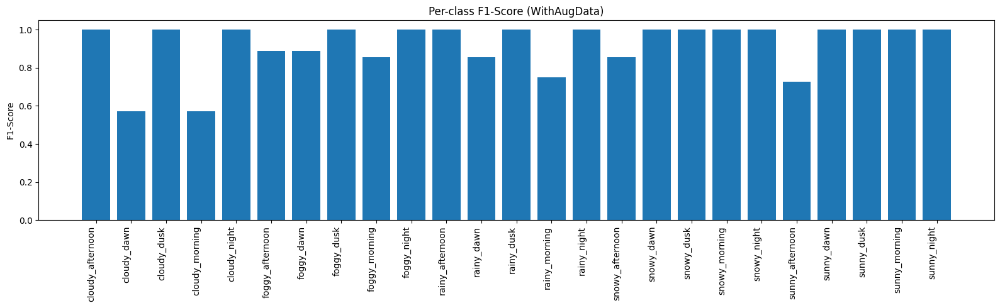

In [48]:
%matplotlib inline

import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import classification_report, f1_score

class_names_aug = [model_aug.names[i] for i in range(len(model_aug.names))]
report = classification_report(y_true, y_pred, target_names=class_names_aug, output_dict=True)
df = pd.DataFrame(report).transpose()
df_classes = df.loc[class_names_aug, ["precision", "recall", "f1-score", "support"]]

print("Per-class metrics (WithAugData, argmax decision):")
display(df_classes)

print(f"Macro F1: {f1_score(y_true, y_pred, average='macro'):.3f} | Micro F1: {f1_score(y_true, y_pred, average='micro'):.3f}")

def plot_metric(metric_name):
    plt.figure(figsize=(16,5))
    plt.bar(range(len(df_classes)), df_classes[metric_name].values)
    plt.xticks(range(len(df_classes)), df_classes.index, rotation=90, ha='right')
    plt.ylabel(metric_name.title())
    plt.title(f"Per-class {metric_name.title()} (WithAugData)")
    plt.tight_layout()
    plt.savefig(f"withaug_per_class_{metric_name.replace('-', '')}.png", dpi=200)
    plt.show()

for metric in ["precision", "recall", "f1-score"]:
    plot_metric(metric)


Loading BEST: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\weights\best.pt
Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,558,049 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\train... found 800 images in 25 classes  
val: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\val... found 100 images in 25 classes  
ERROR test: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\test... found 60 images in 11 classes (requires 25 classes, not 11)
val: Fast image access  (ping: 0.10.0 ms, read: 1294.7382.9 MB/s, size: 2341.7 KB)
val: Scanning C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\val... 100 images, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 157.3Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 7/7 1.8it/s 3.8s
                  

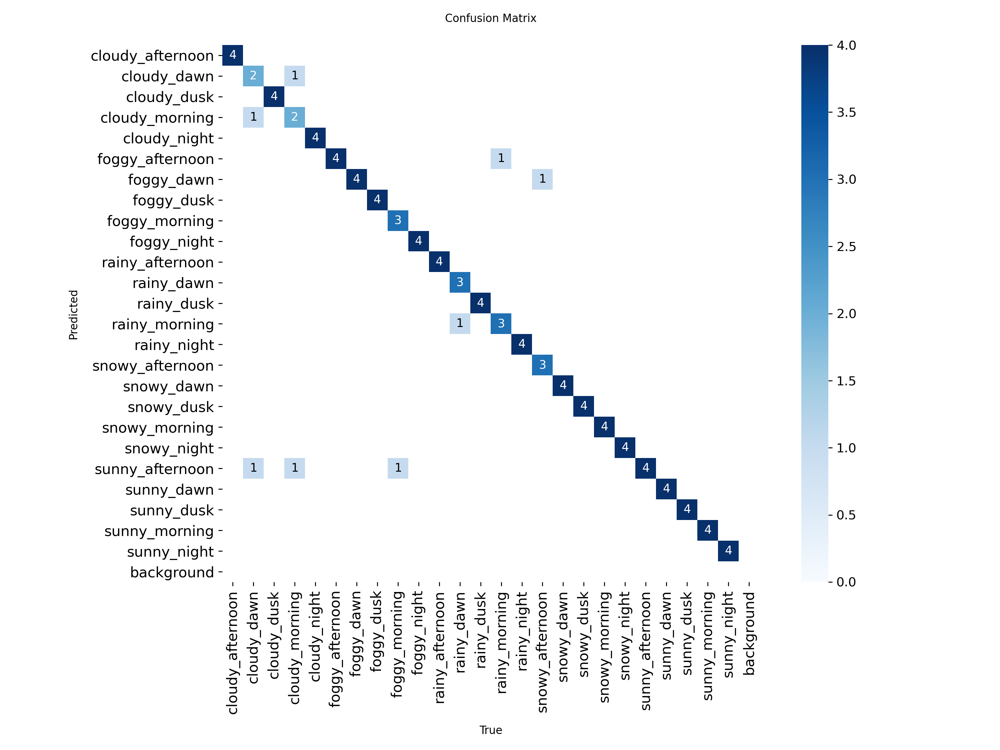

C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\val\confusion_matrix.png exists: False
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\test\confusion_matrix.png exists: False
C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\results.png exists: True


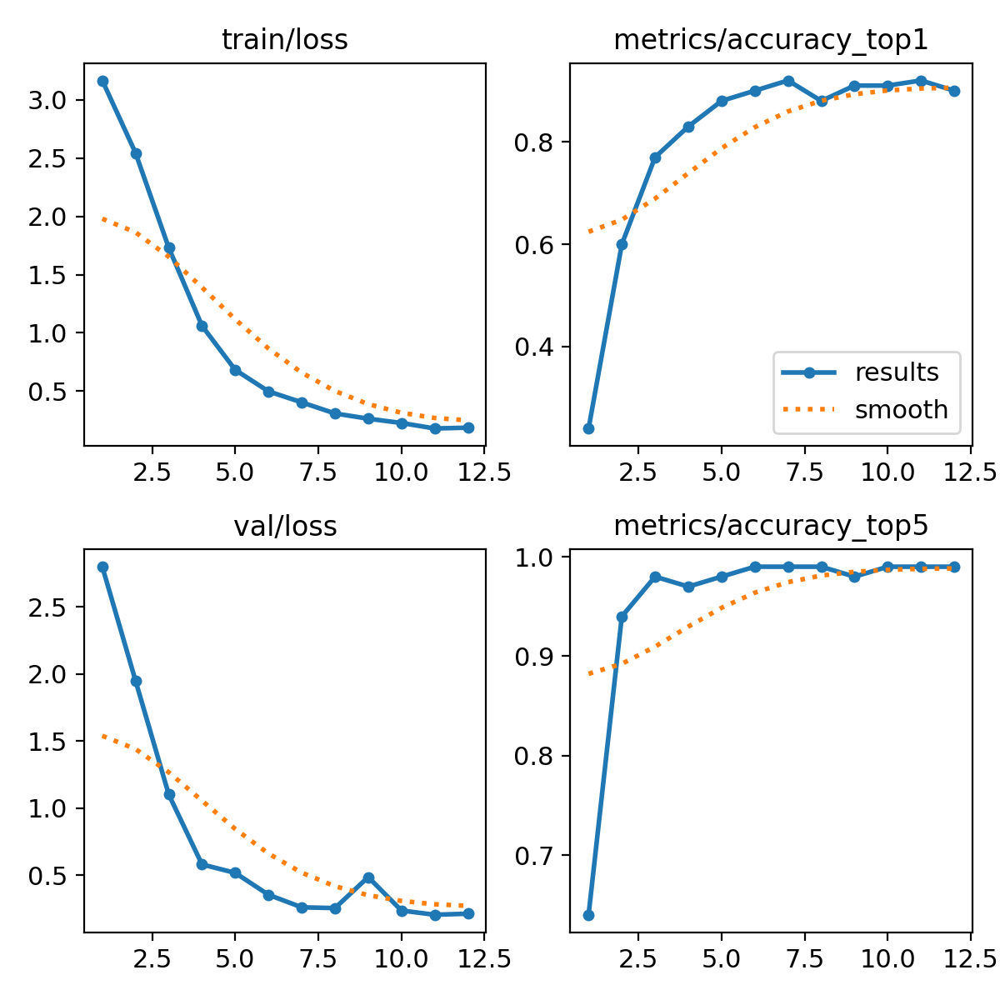


Model classes (index -> name):
{0: 'cloudy_afternoon', 1: 'cloudy_dawn', 2: 'cloudy_dusk', 3: 'cloudy_morning', 4: 'cloudy_night', 5: 'foggy_afternoon', 6: 'foggy_dawn', 7: 'foggy_dusk', 8: 'foggy_morning', 9: 'foggy_night', 10: 'rainy_afternoon', 11: 'rainy_dawn', 12: 'rainy_dusk', 13: 'rainy_morning', 14: 'rainy_night', 15: 'snowy_afternoon', 16: 'snowy_dawn', 17: 'snowy_dusk', 18: 'snowy_morning', 19: 'snowy_night', 20: 'sunny_afternoon', 21: 'sunny_dawn', 22: 'sunny_dusk', 23: 'sunny_morning', 24: 'sunny_night'}


In [52]:
# --- Augmented run: generate & display confusion matrices (val + test) ---
from pathlib import Path
from ultralytics import YOLO
from IPython.display import Image, display

# Must match your augmented training run name
RUN_NAME   = "weather_time_cls_y11_WithAugData"   # or use AUG_RUN_NAME if you defined it
DATA_ROOT  = AUG_ROOT                             # augmented dataset root (WithAugData)
RUNS_ROOT  = DATA_DIR / "runs" / "classify" / RUN_NAME / "weights"
BEST = RUNS_ROOT / "best.pt"
LAST = RUNS_ROOT / "last.pt"

# Load best (fallback to last)
if BEST.exists():
    print("Loading BEST:", BEST)
    model_aug_best = YOLO(str(BEST))
elif LAST.exists():
    print("BEST not found; loading LAST:", LAST)
    model_aug_best = YOLO(str(LAST))
else:
    raise FileNotFoundError(f"No weights found under {RUNS_ROOT}")

# Make sure Ultralytics writes confusion_matrix.png for both splits
_ = model_aug_best.val(data=str(DATA_ROOT), plots=True)                 # VAL plots
_ = model_aug_best.val(data=str(DATA_ROOT), split="test", plots=True)   # TEST plots

# Now display any confusion matrices Ultralytics produced for this run
RUNS_DIR = DATA_DIR / "runs" / "classify" / RUN_NAME
candidates = [
    RUNS_DIR / "confusion_matrix.png",          # sometimes top-level
    RUNS_DIR / "val"  / "confusion_matrix.png", # validation
    RUNS_DIR / "test" / "confusion_matrix.png", # test
    RUNS_DIR / "results.png",
]

for p in candidates:
    print(p, "exists:", p.exists())
    if p.exists():
        display(Image(filename=str(p)))

print("\nModel classes (index -> name):")
print(model_aug_best.names)

Loading BEST: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\runs\classify\weather_time_cls_y11_WithAugData\weights\best.pt
Ultralytics 8.3.224  Python-3.13.9 torch-2.9.0+cpu CPU (Intel Core Ultra 9 275HX)
YOLO11n-cls summary (fused): 47 layers, 1,558,049 parameters, 0 gradients, 3.2 GFLOPs
train: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\train... found 800 images in 25 classes  
val: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\val... found 100 images in 25 classes  
ERROR test: C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\test... found 60 images in 11 classes (requires 25 classes, not 11)
test: Fast image access  (ping: 0.00.0 ms, read: 2584.8416.6 MB/s, size: 2044.1 KB)
test: Scanning C:\Users\Kayne\Desktop\IAT360_ComputerVision_Project\WithAugData\test... 60 images, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 200.0Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 4/4 1.7it/s 2.4s
                  

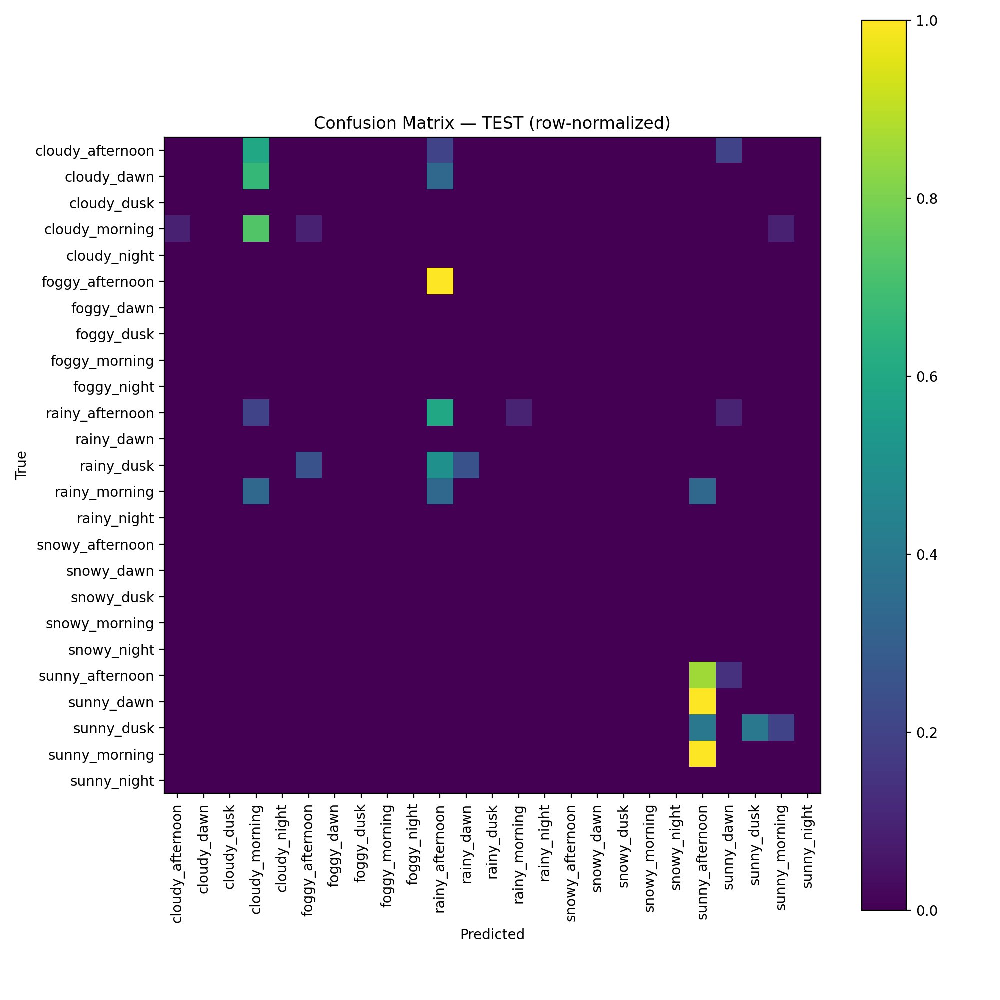

In [56]:
# --- Generate a NORMALIZED TEST confusion matrix into DATA_DIR/testrun ---
from pathlib import Path
from ultralytics import YOLO
from IPython.display import Image, display
import numpy as np
import matplotlib.pyplot as plt
import os

# Choose which run/data root you want to evaluate
RUN_NAME  = "weather_time_cls_y11_WithAugData"  # or your no-aug run name
DATA_ROOT = AUG_ROOT                             # or NOAUG_ROOT

TESTRUN_DIR = DATA_DIR / "testrun"
TESTRUN_DIR.mkdir(parents=True, exist_ok=True)

# Load best (fallback last)
RUNS_DIR  = DATA_DIR / "runs" / "classify" / RUN_NAME / "weights"
CKPT_BEST = RUNS_DIR / "best.pt"
CKPT_LAST = RUNS_DIR / "last.pt"
if CKPT_BEST.exists():
    print("Loading BEST:", CKPT_BEST)
    model_eval = YOLO(str(CKPT_BEST))
elif CKPT_LAST.exists():
    print("BEST not found; loading LAST:", CKPT_LAST)
    model_eval = YOLO(str(CKPT_LAST))
else:
    raise FileNotFoundError(f"No weights found under {RUNS_DIR}")

# Try Ultralytics' own plots (it *may* produce a normalized PNG)
_ = model_eval.val(
    data=str(DATA_ROOT),
    split="test",
    plots=True,
    project=str(DATA_DIR),
    name="testrunWithAug"  # saves into DATA_DIR/testrun
)

# Prefer a normalized matrix if Ultralytics wrote one
ultra_candidates = [
    TESTRUN_DIR / "confusion_matrix_normalized.png",
    TESTRUN_DIR / "test" / "confusion_matrix_normalized.png"
]
shown = False
for p in ultra_candidates:
    if p.exists():
        print("Found Ultralytics normalized matrix at:", p)
        display(Image(filename=str(p)))
        shown = True
        break

# If Ultralytics didn't produce normalized, build our own ROW-NORMALIZED matrix and save it.
if not shown:
    print("Ultralytics normalized PNG not found — creating one manually…")

    # 1) Collect TEST data
    TEST_DIR = DATA_ROOT / "test"
    img_exts = {".jpg", ".jpeg", ".png", ".bmp"}

    paths, labels = [], []
    name_to_idx = {name:i for i, name in model_eval.names.items()}
    for cls_dir in sorted(TEST_DIR.iterdir()):
        if cls_dir.is_dir() and cls_dir.name in name_to_idx:
            for f in cls_dir.iterdir():
                if f.suffix.lower() in img_exts:
                    paths.append(str(f))
                    labels.append(name_to_idx[cls_dir.name])

    # 2) Predict and build confusion matrix
    preds = model_eval.predict(source=paths, imgsz=224, verbose=False)
    y_true = np.array(labels, dtype=int)
    y_pred = np.array([int(r.probs.top1) for r in preds], dtype=int)

    from sklearn.metrics import confusion_matrix
    labels_txt = [model_eval.names[i] for i in range(len(model_eval.names))]
    cm = confusion_matrix(y_true, y_pred, labels=range(len(labels_txt)))

    # 3) Row-normalize (each row sums to 1.0); guard zeros
    with np.errstate(divide="ignore", invalid="ignore"):
        row_sums = cm.sum(axis=1, keepdims=True)
        cm_norm = cm.astype(float) / np.where(row_sums == 0, 1, row_sums)
        cm_norm = np.nan_to_num(cm_norm, nan=0.0, posinf=0.0, neginf=0.0)

    # 4) Plot & save normalized matrix
    plt.figure(figsize=(10, 10))
    plt.imshow(cm_norm, interpolation="nearest")
    plt.title("Confusion Matrix — TEST (row-normalized)")
    plt.xticks(range(len(labels_txt)), labels_txt, rotation=90)
    plt.yticks(range(len(labels_txt)), labels_txt)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.colorbar()
    plt.tight_layout()
    out_png = TESTRUN_DIR / "confusion_matrix_normalized.png"
    plt.savefig(out_png, dpi=200)
    plt.show()
    print("Saved normalized confusion matrix to:", out_png)


Worked and Failed examples

In [49]:
# --- Collect test images from WithAugData and get predictions with model_aug ---
import random
from pathlib import Path
import numpy as np

# Reuse your paths
TEST_DIR_AUG = AUG_ROOT / "test"

# Safety checks
assert 'model_aug' in globals(), "model_aug is not defined. Run the augmented training cell first."
assert TEST_DIR_AUG.exists(), f"Missing folder: {TEST_DIR_AUG}"

# Gather test images
img_exts = {".jpg", ".jpeg", ".png", ".bmp"}
test_imgs_aug = []
for cls_dir in sorted(TEST_DIR_AUG.iterdir()):
    if cls_dir.is_dir():
        for p in cls_dir.iterdir():
            if p.suffix.lower() in img_exts:
                test_imgs_aug.append(p)

print("WithAugData test images:", len(test_imgs_aug))
assert len(test_imgs_aug) > 0, "No test images found under WithAugData/test"

# Sample a manageable subset if you like
random.seed(42)
N_SHOW = min(200, len(test_imgs_aug))   # adjust if needed
sample_paths_aug = random.sample(test_imgs_aug, N_SHOW) if len(test_imgs_aug) > N_SHOW else test_imgs_aug

# Predict probabilities
preds_aug = model_aug.predict(source=[str(p) for p in sample_paths_aug], imgsz=224, verbose=False)

# Build records: (path, true_idx, pred_idx)
name_to_idx_aug = {v: k for k, v in model_aug.names.items()}
file_records_aug = []
for p, r in zip(sample_paths_aug, preds_aug):
    true_cls = p.parent.name                   # folder name is GT
    true_idx = name_to_idx_aug.get(true_cls)
    pred_idx = int(r.probs.top1) if hasattr(r, "probs") else None
    file_records_aug.append((p, true_idx, pred_idx))

# Split into worked/failed
worked_aug   = [(p,t) for (p,t,pr) in file_records_aug if t == pr]
failed_aug   = [(p,t,pr) for (p,t,pr) in file_records_aug if t != pr]
print(f"Worked: {len(worked_aug)}  |  Failed: {len(failed_aug)}")

WithAugData test images: 60
Worked: 22  |  Failed: 38



=== Worked examples (WithAugData) (showing up to 12) ===
TRUE = cloudy_morning — 0049-01-04.png


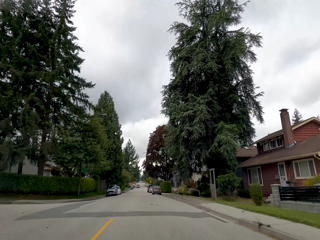

TRUE = cloudy_morning — 0050-01-04.png


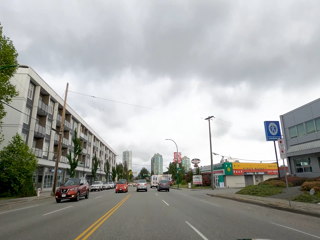

TRUE = cloudy_morning — 0053-01-04.png


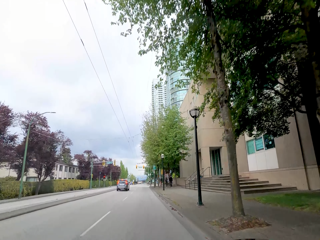

TRUE = cloudy_morning — 0054-01-04.png


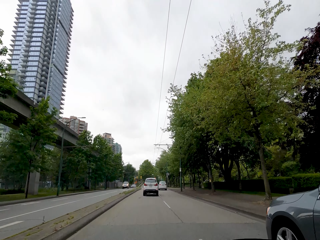

TRUE = cloudy_morning — 0055-01-04.png


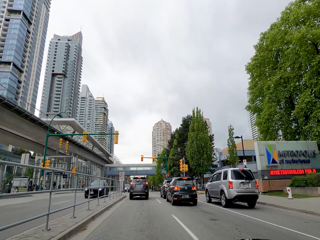

TRUE = cloudy_morning — 0056-01-04.png


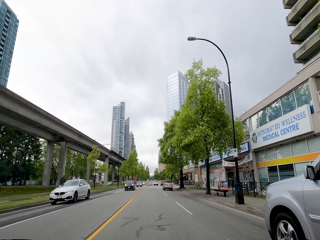

TRUE = cloudy_morning — 0057-01-04.png


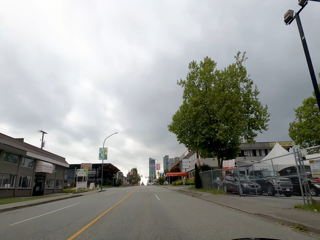

TRUE = cloudy_morning — 0059-01-04.png


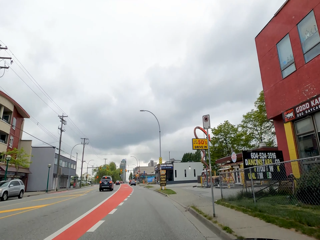

TRUE = rainy_afternoon — 0010-03-01.png


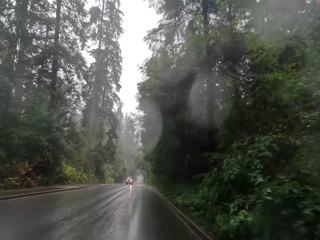

TRUE = rainy_afternoon — 0012-03-01.png


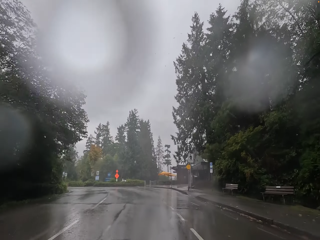

TRUE = rainy_afternoon — 0016-03-01.png


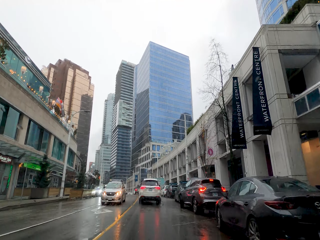

TRUE = rainy_afternoon — 0043-03-01.png


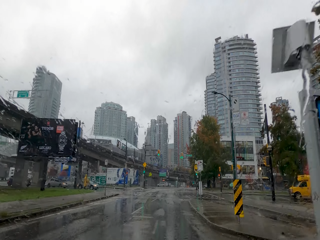


=== Failed examples (WithAugData) (showing up to 12) ===
TRUE = cloudy_afternoon | PRED = sunny_dawn — 0003-01-01.png


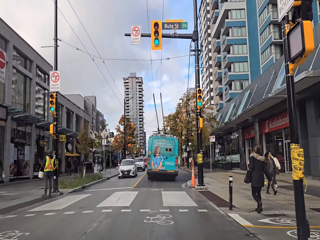

TRUE = cloudy_afternoon | PRED = rainy_afternoon — 0013-01-01.png


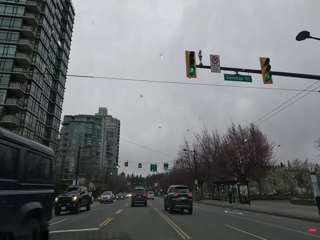

TRUE = cloudy_afternoon | PRED = cloudy_morning — 0048-01-01.png


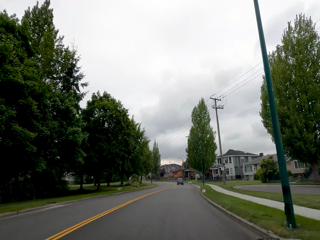

TRUE = cloudy_afternoon | PRED = cloudy_morning — 0051-01-01.png


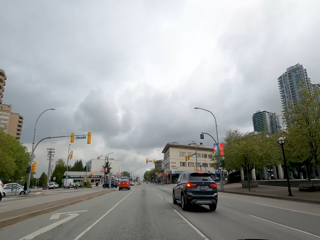

TRUE = cloudy_afternoon | PRED = cloudy_morning — 0058-01-01.png


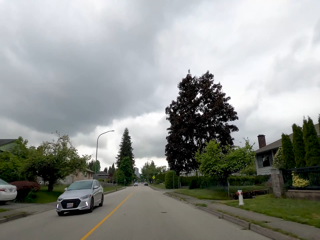

TRUE = cloudy_dawn | PRED = cloudy_morning — 0004-01-02.png


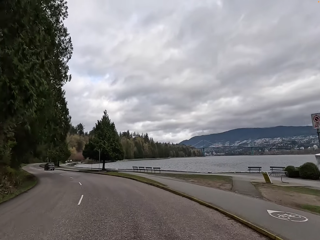

TRUE = cloudy_dawn | PRED = cloudy_morning — 0006-01-02.png


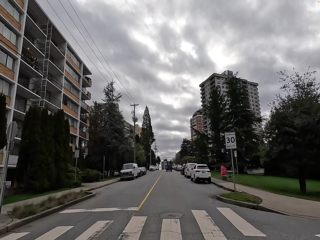

TRUE = cloudy_dawn | PRED = rainy_afternoon — 0045-01-02.png


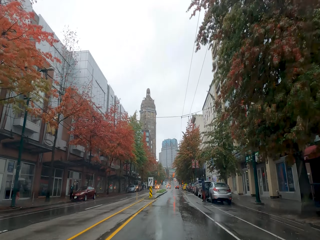

TRUE = cloudy_morning | PRED = cloudy_afternoon — 0005-01-04.png


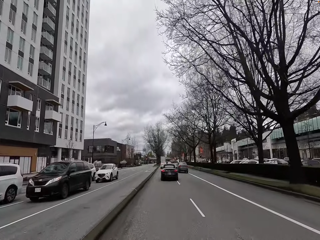

TRUE = cloudy_morning | PRED = sunny_morning — 0007-01-04.png


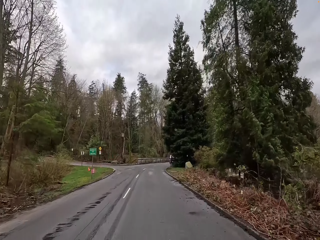

TRUE = cloudy_morning | PRED = foggy_afternoon — 0052-01-04.png


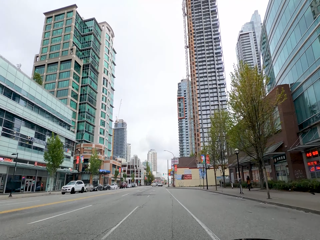

TRUE = foggy_afternoon | PRED = rainy_afternoon — 0011-02-01.png


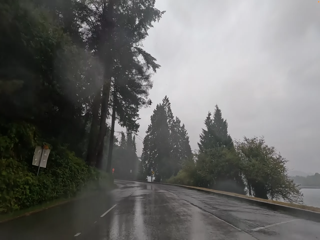

In [50]:
# --- Show "Worked" and "Failed" galleries for augmented model ---
from PIL import Image as PILImage
from IPython.display import display
import os

def show_images_aug(items, title, max_show=12, save_thumb_dir=None):
    print(f"\n=== {title} (showing up to {max_show}) ===")
    if save_thumb_dir:
        os.makedirs(save_thumb_dir, exist_ok=True)

    count = 0
    for entry in items:
        if count >= max_show:
            break

        if len(entry) == 2:
            p, t = entry
            txt = f"TRUE = {model_aug.names.get(t)}"
        else:
            p, t, pr = entry
            txt = f"TRUE = {model_aug.names.get(t)} | PRED = {model_aug.names.get(pr)}"

        print(txt, "—", p.name)
        try:
            img = PILImage.open(p).convert("RGB").resize((320, 240))
            display(img)
            if save_thumb_dir:
                # Save a small thumbnail so you have a record outside the notebook
                thumb_name = f"{p.stem}_{'OK' if len(entry)==2 else 'ERR'}.jpg"
                img.save(os.path.join(save_thumb_dir, thumb_name), quality=92)
        except Exception as e:
            print("Image open error:", e)

        count += 1

# Show and (optionally) save thumbnails
show_images_aug(worked_aug, "Worked examples (WithAugData)", max_show=12, save_thumb_dir=None)   # or "worked_thumbs"
show_images_aug(failed_aug, "Failed examples (WithAugData)", max_show=12, save_thumb_dir=None)   # or "failed_thumbs"
